In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [62]:
database = input("Ingrese si el nuevo empleado será líder o empleado (L), (E), o (NA): ").strip().upper()

if database == "L":
    database = pd.read_csv('../data/data_leaders.csv')
elif database == "E":
    database = pd.read_csv('../data/data_no_leaders.csv')
elif database == "NA":
    database = pd.read_csv('../data/data_global_clean.csv')
else:
    print("Entrada inválida. Se usará data_global_clean.csv por defecto.")
    database = pd.read_csv('../data/data_global_clean.csv')


In [53]:
print(database.columns.tolist())


['Date', 'Email', 'Name', 'Position', 'Seniority', 'Location', 'Studio', 'Client', 'Client Tag', 'Project', 'Project Tag', 'Team Name', 'Engagement', 'Email Leader', 'Year', 'Month', 'Day', 'DateDT', 'ID', 'Leader_ID']


In [63]:
database['Location'].value_counts().sort_index()

Location
AR/CABA/BA        3479
CL/RM/SCL         1146
CO/ANT/MED        1093
CO/CUN/BOG        2162
MX/CDMX/CDMX      1882
MX/JALISCO/GDL     464
Name: count, dtype: int64

In [58]:
def pedir_locations(df):
    # Si no hay columna Location, no hacemos nada especial
    if "Location" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Location'.")
        print("   → Se omitirá la selección de ubicación.\n")
        return {"tipo": "sin_location", "locations": None}

    # Todas las locations disponibles en esa base
    locations = sorted(df["Location"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(locations) + 1

    print("Seleccione las posibles ubicaciones del nuevo empleado:")
    for i, loc in enumerate(locations, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / ubicación desconocida")
    print("0. Terminar selección\n")

    seleccionadas = set()
    unknown = False

    while True:
        respuesta = input("Ingrese el número de la ubicación (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        # validar que sea número
        if not respuesta.isdigit():
            print("❌ Ingresa un número válido.")
            continue

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True
            seleccionadas.clear()   # descartamos cualquier selección previa
            break

        # Rango válido de locations
        if 1 <= opcion <= len(locations):
            seleccionadas.add(locations[opcion - 1])
            print("✔ Agregada:", locations[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    # Armamos la respuesta en un dict para que sea claro qué pasó
    if unknown:
        return {"tipo": "desconocida", "locations": None}
    elif seleccionadas:
        return {"tipo": "lista", "locations": sorted(seleccionadas)}
    else:
        # no eligió nada y tampoco marcó desconocida
        return {"tipo": "vacia", "locations": []}
ubicaciones_nuevas = pedir_locations(database)


Seleccione las posibles ubicaciones del nuevo empleado:
1. AR/CABA/BA
2. CL/RM/SCL
3. CO/ANT/MED
4. CO/CUN/BOG
5. MX/JALISCO/GDL
6. No se sabe / ubicación desconocida
0. Terminar selección

✔ Agregada: MX/JALISCO/GDL
✔ Agregada: AR/CABA/BA


In [ ]:
def pedir_Proyecto(df):
    locations = sorted(df["Location"].dropna().unique())
    
    print("Ingrese la ubicación del nuevo integrante. Seleccione entre:\n")
    for i, loc in enumerate(locations, start=1):
        print(f"{i}. {loc}")
    
    while True:
        try:
            opcion = int(input("\nEscriba el número de la ubicación: "))
            if 1 <= opcion <= len(locations):
                return locations[opcion - 1]
            else:
                print("Número fuera de rango, intenta de nuevo.")
        except ValueError:
            print("Ingresa un número válido, por favor.")

# Uso:
loc_nuevo = pedir_location(database)
print("Ubicación seleccionada:", loc_nuevo)

In [ ]:
database.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10226 entries, 0 to 10225
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          10226 non-null  object 
 1   Email         10226 non-null  object 
 2   Name          10226 non-null  object 
 3   Position      10226 non-null  object 
 4   Seniority     10226 non-null  object 
 5   Location      10226 non-null  object 
 6   Studio        10226 non-null  object 
 7   Client        10226 non-null  object 
 8   Client Tag    10226 non-null  object 
 9   Project       10226 non-null  object 
 10  Project Tag   10226 non-null  object 
 11  Team Name     10226 non-null  object 
 12  Engagement    10226 non-null  float64
 13  Email Leader  10226 non-null  object 
 14  Year          10226 non-null  int64  
 15  Month         10226 non-null  int64  
 16  Day           10226 non-null  int64  
 17  DateDT        10226 non-null  object 
 18  ID            10226 non-nu

In [ ]:
database['Engagement'].value_counts().sort_index()

Engagement
0.00    236
0.03     19
0.05     10
0.07      7
0.08      8
       ... 
4.96      7
4.97     18
4.98      5
4.99      4
5.00    133
Name: count, Length: 370, dtype: int64

In [ ]:
data = database[[ 'Month', 'Day', 'Engagement', "ID" ]]

In [29]:
i = 0
# Múltiplos de n/10
n = 10




for value in data['Engagement']:
    if value < .1 * n and value > 0:
        data['Engagement'][i] = .1 * n
    else:
        data['Engagement'][i] = round(value / n, 1) * n
    i += 1

C:\Users\angel\AppData\Local\Temp\ipykernel_27236\2222539164.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['Engagement'][i] = round(value / n, 1) * n
C:\Users\angel\AppData\Local\Temp\ipykernel_27236\2222539164.py:12: FutureWarni

In [30]:
data['Engagement'].value_counts().shape

(6,)

In [31]:
data['Engagement'].value_counts().sort_index()

Engagement
0.0     236
1.0     378
2.0    1857
3.0    4800
4.0    2451
5.0     504
Name: count, dtype: int64

In [32]:
data = data.sort_values(["ID", "Month", "Day"]).reset_index(drop=True)

In [33]:
data.head()
data.to_csv("../data/data_test.csv", index=False)

In [34]:
states = data["Engagement"].values

In [35]:
unique_states = np.sort(data["Engagement"].unique())
n_states = data['Engagement'].value_counts().shape[0]

In [36]:
# Mapeo de estados
state_to_idx = {state: i for i, state in enumerate(unique_states)}

In [37]:
# Initialize transition count matrix
transition_counts = np.zeros((n_states, n_states), dtype=int)

In [38]:
transition_counts

array([[0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0]])

In [39]:
for i in range(len(states) - 1):
    if data["ID"].values[i] != data["ID"].values[i + 1]:
        continue  # Skip transitions between different IDs
    s_current = state_to_idx[states[i]]
    s_next = state_to_idx[states[i + 1]]
    transition_counts[s_current, s_next] += 1

In [40]:
transition_counts = transition_counts / transition_counts.sum(axis=1, keepdims=True)

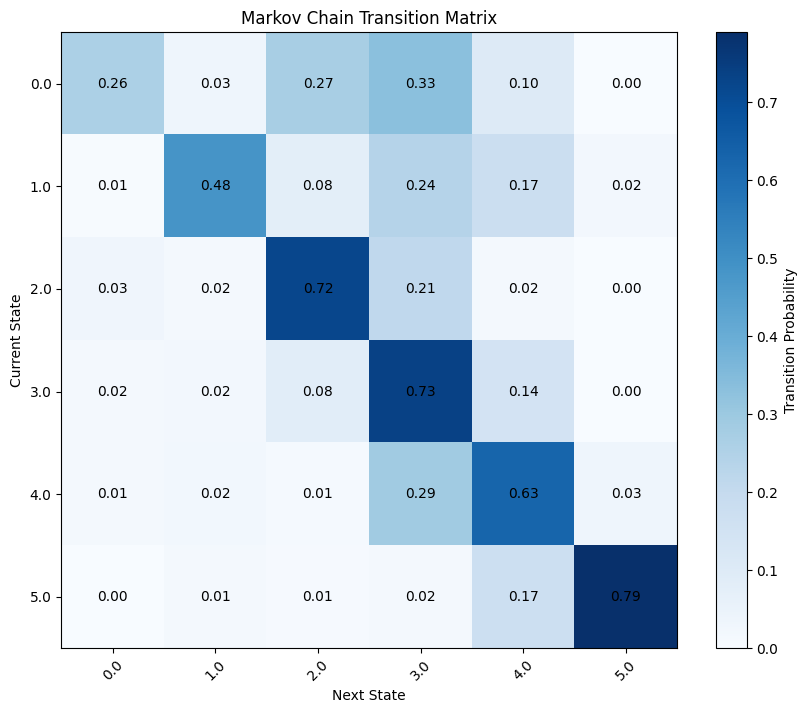

In [41]:
# Plot the transition matrix
plt.figure(figsize=(10, 8))
plt.imshow(transition_counts, cmap='Blues', interpolation='nearest')
plt.colorbar(label='Transition Probability')
plt.xticks(ticks=np.arange(n_states), labels=unique_states, rotation=45)
plt.yticks(ticks=np.arange(n_states), labels=unique_states)
plt.xlabel('Next State')
plt.ylabel('Current State')
plt.title('Markov Chain Transition Matrix')
# number labels
for i in range(n_states):
    for j in range(n_states):
        plt.text(j, i, f"{transition_counts[i, j]:.2f}", ha='center', va='center', color='black')
plt.show()

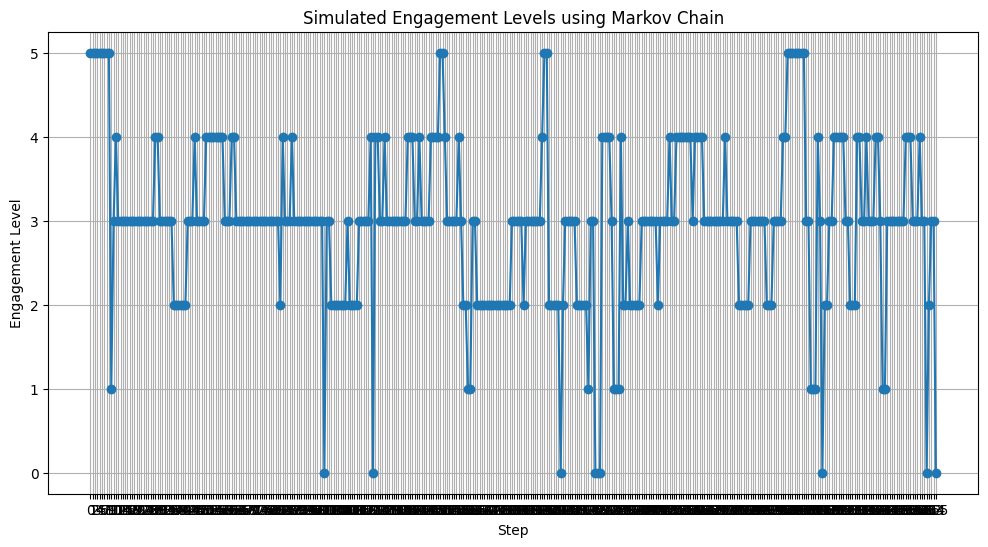

In [42]:
# Simulate the markov chain
n_steps = 365
#current_state = np.random.choice(unique_states)
current_state = 5.0
simulated_states = [current_state]
for _ in range(n_steps):
    current_idx = state_to_idx[current_state]
    next_state = np.random.choice(
        unique_states, p=transition_counts[current_idx])
    simulated_states.append(next_state)
    current_state = next_state

# Plot simulated states
plt.figure(figsize=(12, 6))
plt.plot(simulated_states, marker='o')
plt.xticks(ticks=np.arange(n_steps + 1))
plt.xlabel('Step')
plt.ylabel('Engagement Level')
plt.title('Simulated Engagement Levels using Markov Chain')
plt.grid()
plt.show()